# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
%matplotlib inline
os.listdir("test_images/")
import glob
from moviepy.editor import VideoFileClip

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Read in an Image
Display the images. This is the common function used to display the images when needed

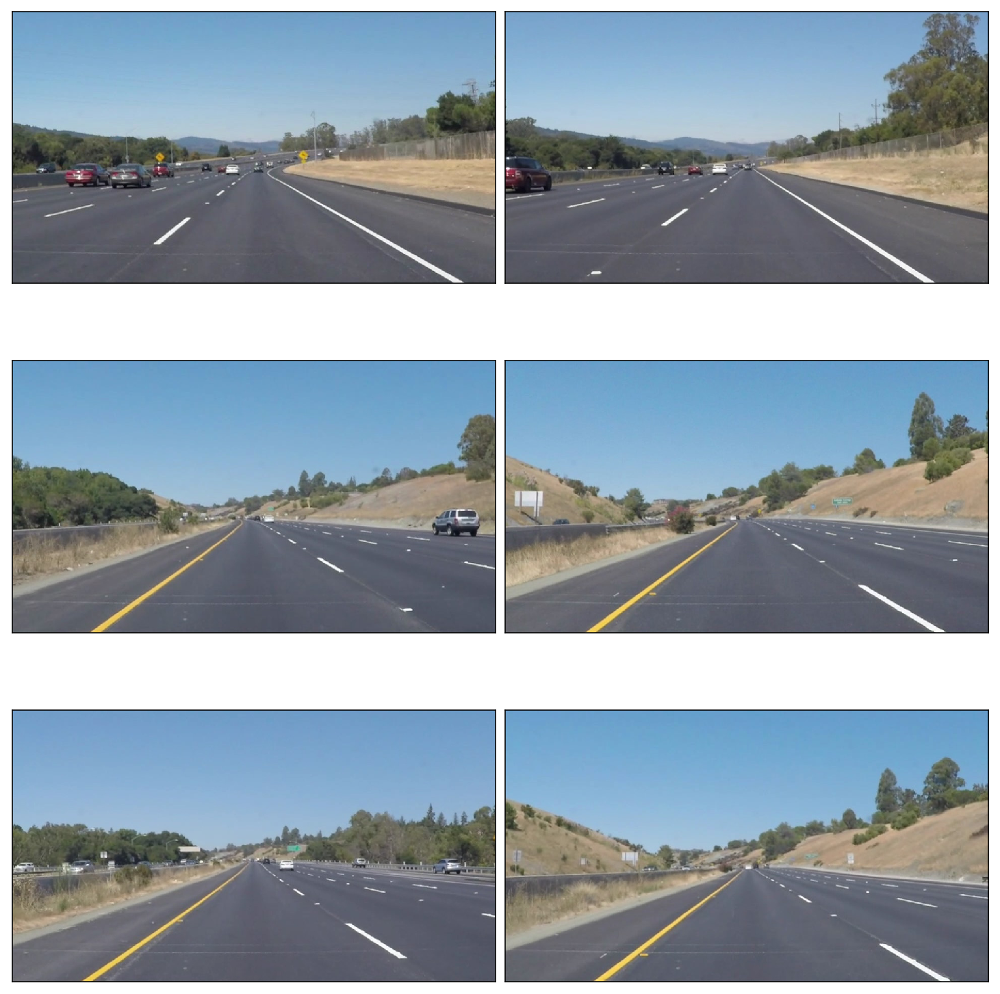

In [2]:
def display_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(10, 11))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]
display_images(test_images)

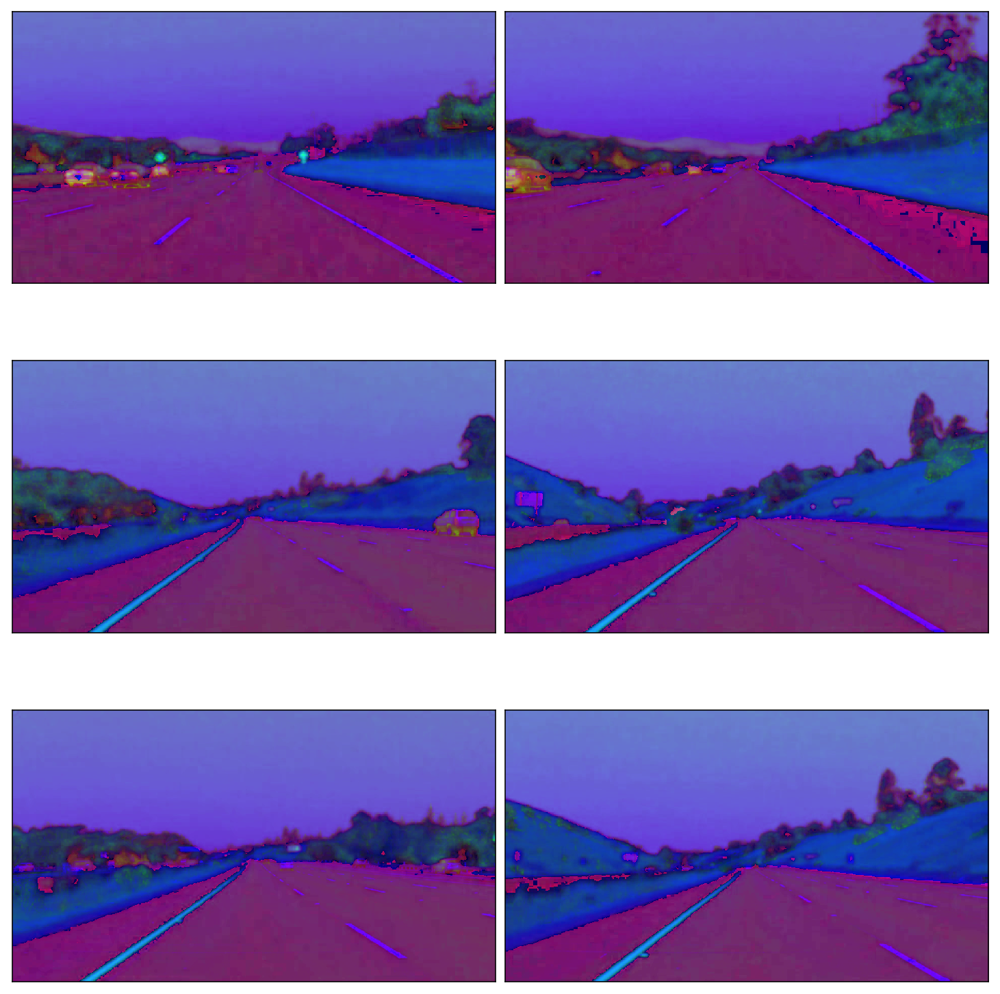

In [3]:
def hsv_trial(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

display_images(list(map(hsv_trial, test_images)))

## Perform HLS Conversion

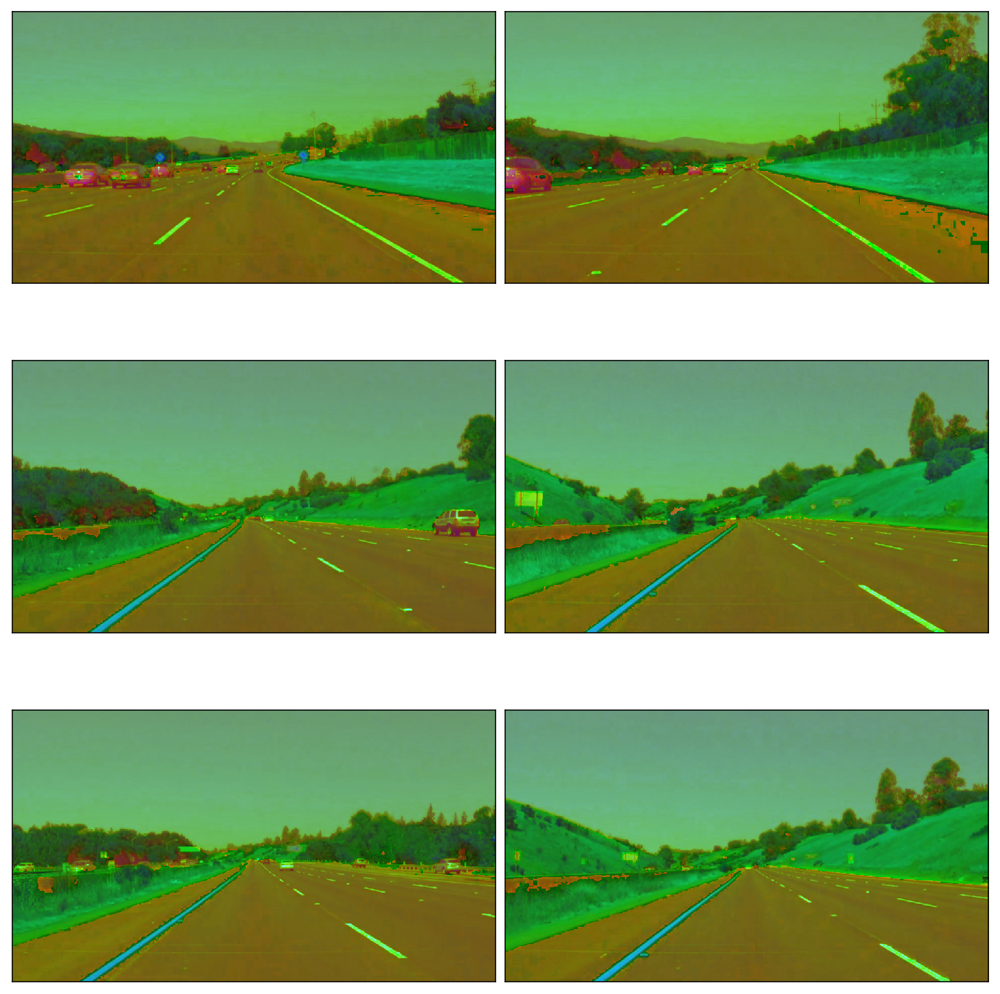

In [4]:
def hls_conversion(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

display_images(list(map(hls_conversion, test_images)))

## Apply the Yellow and White Mask in the HSV image

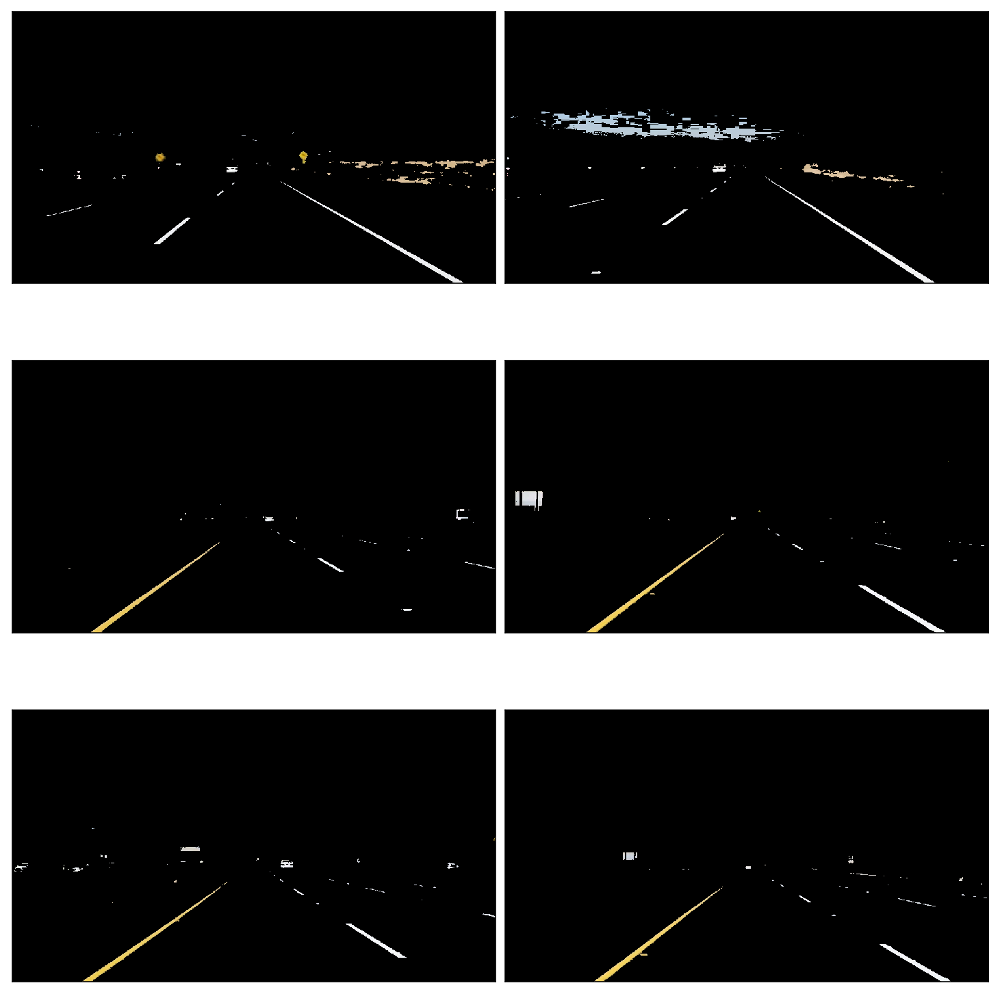

In [5]:
def Apply_YW_mask(image):
    converted = hls_conversion(image)
    # white color mask
    lower_thres = np.uint8([  0, 200,   0])
    upper_thres = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted, lower_thres, upper_thres)
    # yellow color mask
    lower_thres = np.uint8([ 10,   0, 100])
    upper_thres = np.uint8([ 40, 255, 255])
    yellow_mask = cv2.inRange(converted, lower_thres, upper_thres)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    return cv2.bitwise_and(image, image, mask = mask)

whiteyellow_images = list(map(Apply_YW_mask, test_images))

display_images(whiteyellow_images)

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images  
`cv2.cvtColor()` to grayscale or change color  
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions. 
Apply Grayscale

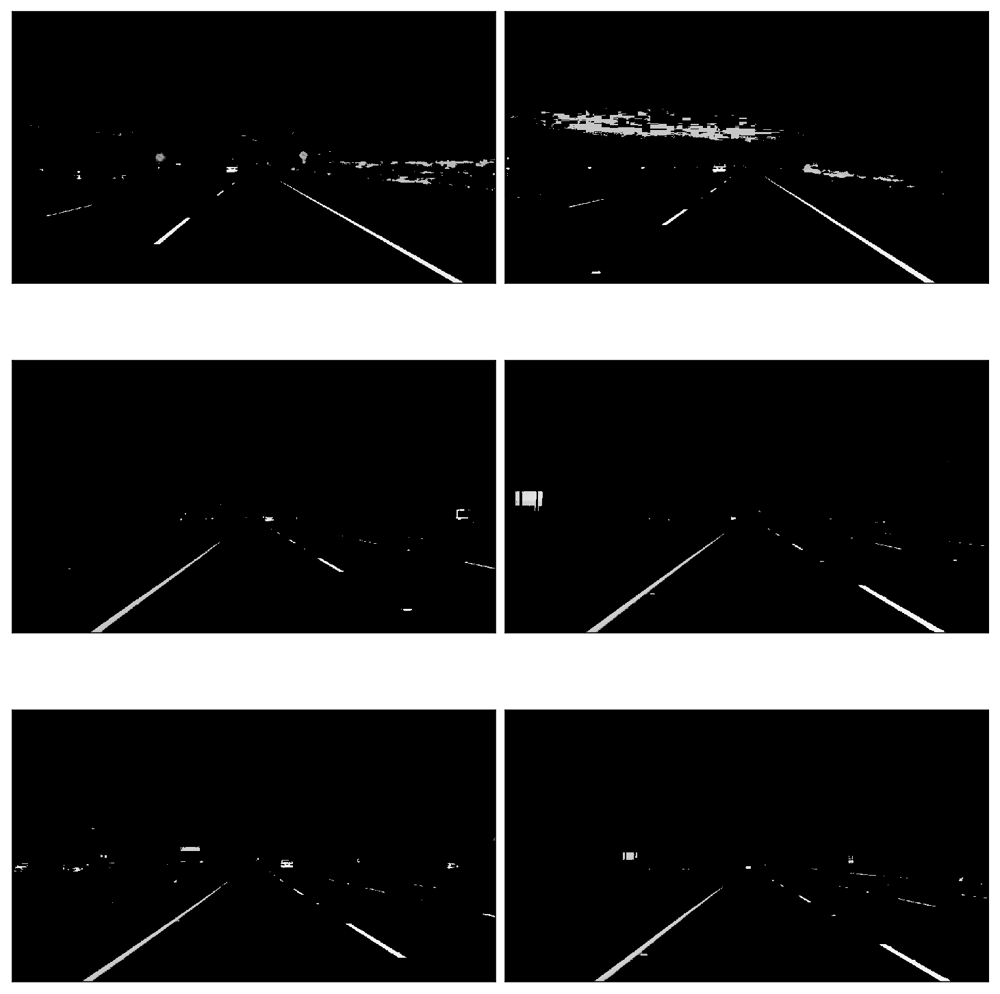

In [6]:
def gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(gray_scale, whiteyellow_images))

display_images(gray_images)

Below are some helper functions to help get you started. They should look familiar from the lesson!

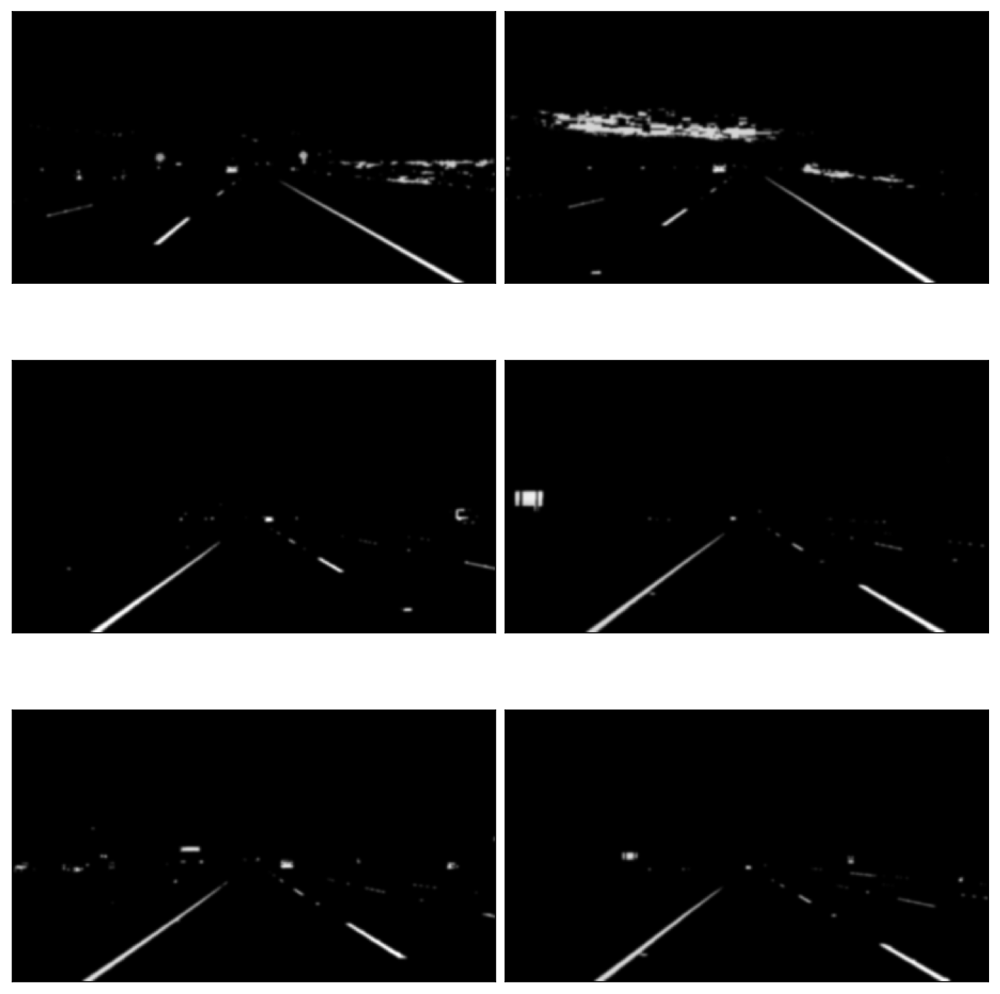

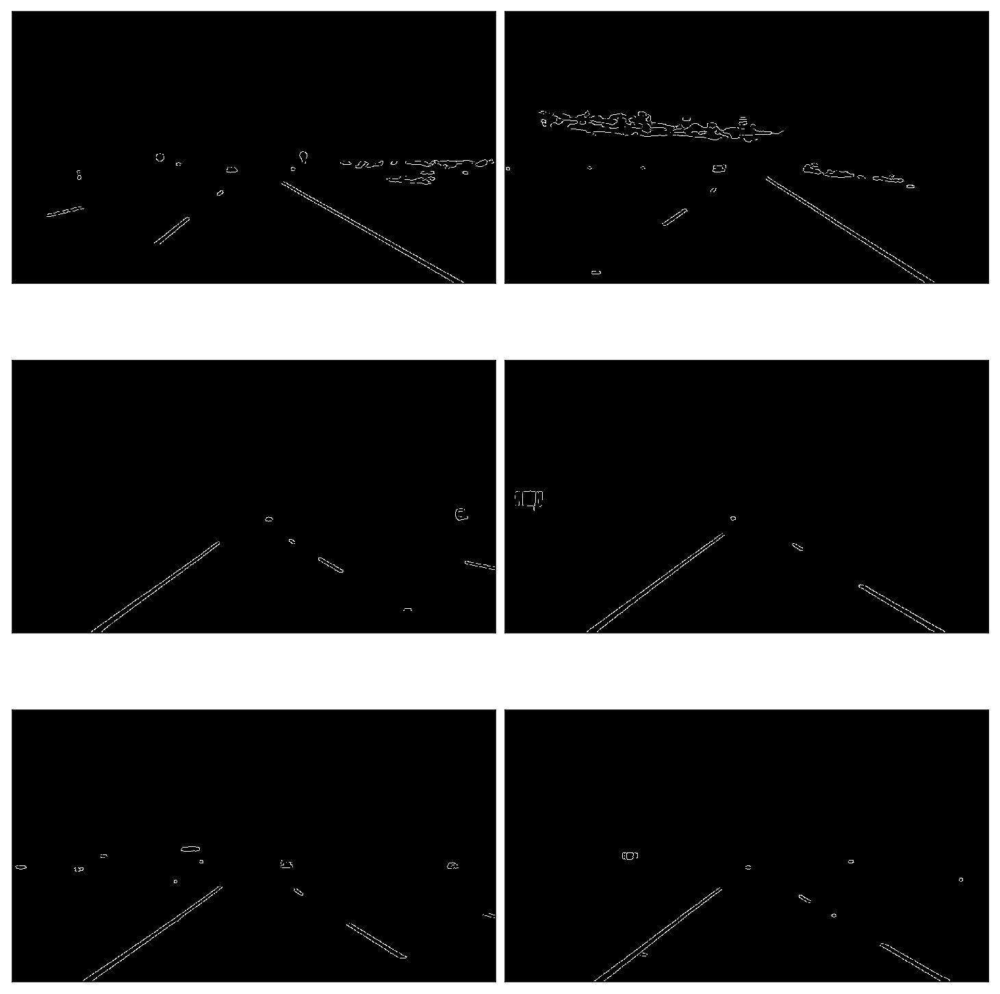

In [7]:
# Image should have already been converted to HSL color space
def isolate_yellow_hsl(img):
    # Caution - OpenCV encodes the data in ****HLS*** format
    # Lower value equivalent pure HSL is (30, 45, 15)
    #low_threshold = np.array([15, 38, 115], dtype=np.uint8)
    low_threshold = np.array([10, 0, 100], dtype=np.uint8)
    # Higher value equivalent pure HSL is (75, 100, 80)
    #high_threshold = np.array([35, 204, 255], dtype=np.uint8)  
    high_threshold = np.array([40, 255, 255], dtype=np.uint8)
    yellow_mask = cv2.inRange(img, low_threshold, high_threshold)
    
    return yellow_mask
                            

# Image should have already been converted to HSL color space
def isolate_white_hsl(img):
    # Caution - OpenCV encodes the data in ***HLS*** format
    # Lower value equivalent pure HSL is (30, 45, 15)
    low_threshold = np.array([0, 200, 0], dtype=np.uint8)
    # Higher value equivalent pure HSL is (360, 100, 100)
    #high_threshold = np.array([180, 255, 255], dtype=np.uint8)  
    high_threshold = np.array([255, 255, 255], dtype=np.uint8)
    white_mask = cv2.inRange(img, low_threshold, high_threshold)
    
    return white_mask


def combine_hsl_isolated_with_original(img, hsl_yellow, hsl_white):
    hsl_mask = cv2.bitwise_or(hsl_yellow, hsl_white)
    return cv2.bitwise_and(img, img, mask=hsl_mask)

def filter_img_hsl(img):
    hsl_img = convert_to_hsl(img)
    hsl_yellow = isolate_yellow_hsl(hsl_img)
    hsl_white = isolate_white_hsl(hsl_img)
    return combine_hsl_isolated_with_original(img, hsl_yellow, hsl_white)

#Gaussian blur
def apply_smoothing(image, kernel_size=15):
    """
    kernel_size must be postivie and odd
    """
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

blurred_imgs = list(map(lambda image: apply_smoothing(image), gray_images))

#display the gaussian blur applied images
display_images(blurred_imgs)


#Apply Canny edges
def canny_edges(image, low_threshold=50, high_threshold=150):
    return cv2.Canny(image, low_threshold, high_threshold)

cannied_imgs = list(map(lambda image: canny_edges(image), blurred_imgs))

display_images(cannied_imgs)

#Filter the selected region
def filter_region(image, vertices):
    """
    Create the mask using the vertices and apply it to the input image
    """
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) # in case, the input image has a channel dimension        
    return cv2.bitwise_and(image, mask)
'''
#select the region of interest in the image. Trial
#This code picks up some noise so corrected in the next function
def select_region(image):
    height = image.shape[0]
    width = image.shape[1]
    region_of_interest_vertices = [
    (0, height),
    (width / 2, height / 2),
    (width, height),
    ]
    vertices = np.array([region_of_interest_vertices], np.int32)
    return filter_region(image, vertices)
'''
#Select the region of interest in the specified image. The above triangle selection seems to pick some unwanted noise    
def select_region(image):
    """
    It keeps the region surrounded by the `vertices`
    Other area is set to black
    """
    # first, define the polygon by vertices
    rows, cols = image.shape[:2]
    bottom_left  = [cols*0.1, rows*0.95]
    top_left     = [cols*0.4, rows*0.6]
    bottom_right = [cols*0.9, rows*0.95]
    top_right    = [cols*0.6, rows*0.6] 
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    return filter_region(image, vertices)

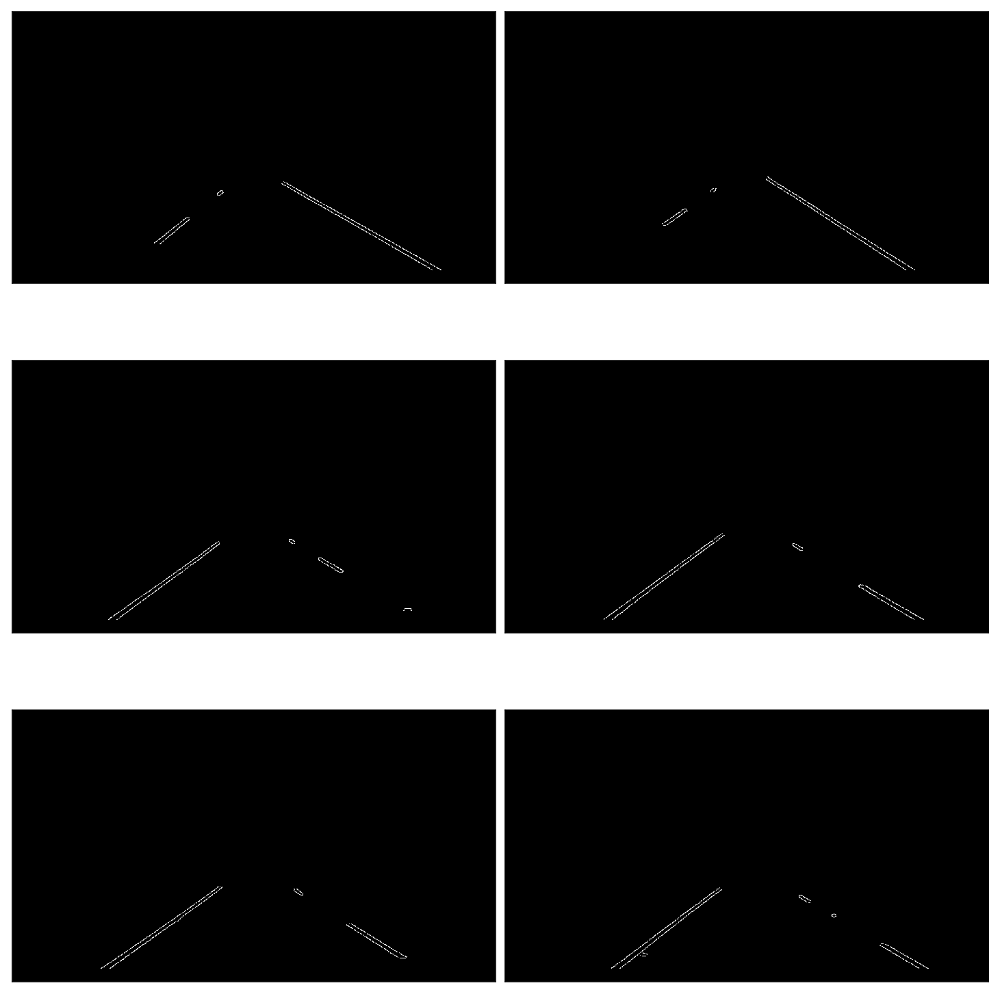

In [8]:
# images showing the region of interest only
int_reg_img = list(map(select_region, cannied_imgs))

#display the images for verification
display_images(int_reg_img)

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

## Apply Hough Transform

In [9]:
def hough_lines(image):
    """
    `image` should be the output of a Canny transform.
    
    Returns hough lines (not the image with lines)
    """
    return cv2.HoughLinesP(image, rho=1, theta=np.pi/180, threshold=20, minLineLength=20, maxLineGap=300)


list_of_lines = list(map(hough_lines, int_reg_img))

In [10]:
def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
    # If there are no lines to draw, exit.
    if lines is None:
       return
    # Make a copy of the original image.
    line_img = np.copy(img)
    # Create a blank image that matches the original in size.
    line_img = np.zeros(
        (
            img.shape[0],
            img.shape[1],
            3
        ),
        dtype=np.uint8,
    )
    # Loop over all lines and draw them on the blank image.
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
    # Merge the image with the lines onto the original.
    return cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)


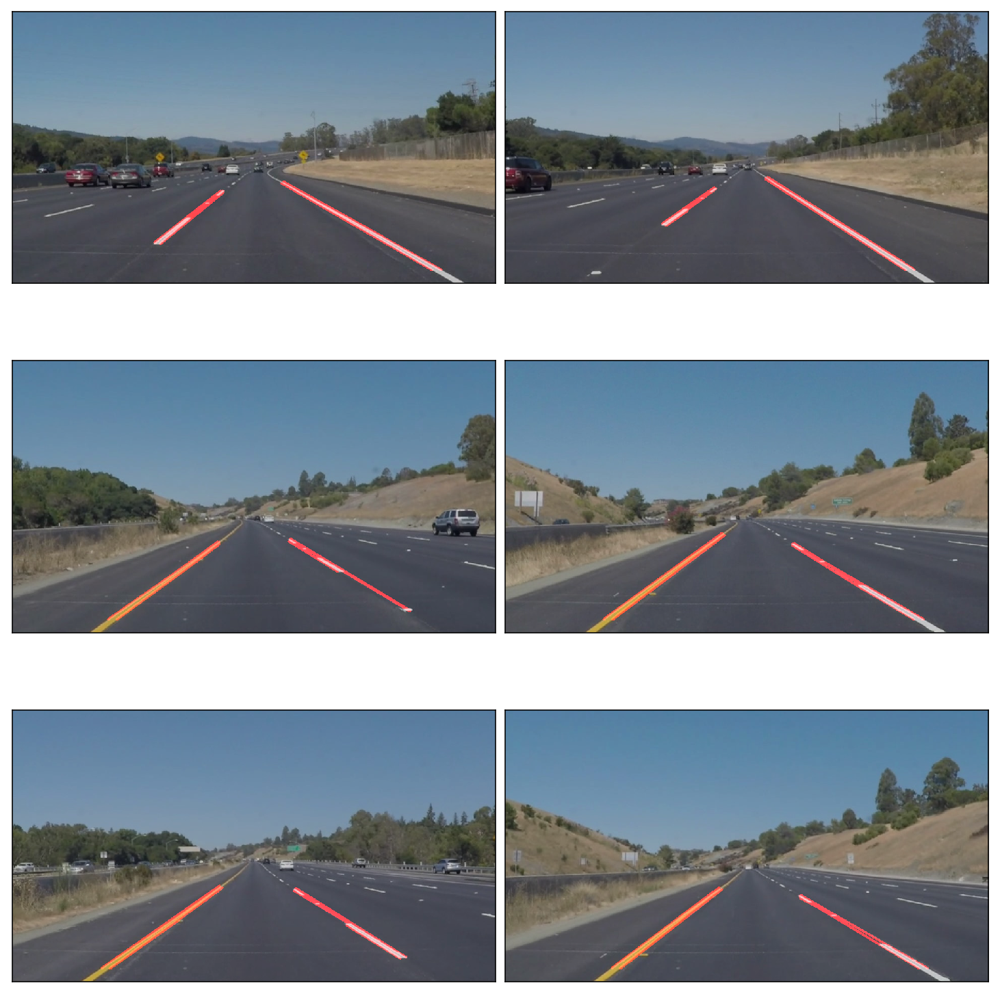

In [11]:
# List to hold the images
images_drawn = []

for image, lines in zip(test_images,list_of_lines):
   images_drawn.append(draw_lines(image,lines))

display_images(images_drawn)

In [12]:
#find the region of interest by masking the portion of image which is not of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

# Construct the dots using already having hough lines
def average_slope_intercept(lines):
    left_lines    = [] # (slope, intercept)
    left_weights  = [] # (length,)
    right_lines   = [] # (slope, intercept)
    right_weights = [] # (length,)
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2==x1:
                continue # ignore a vertical line
            #Slope m = Ax + B. Intercept is the point where it meets the axis
            slope = (y2-y1)/(x2-x1)
            intercept = y1 - slope*x1 # Intercept is B = y - Ax
            length = np.sqrt((y2-y1)**2+(x2-x1)**2)
            # Left line since the slope is negative
            if slope < 0: # y is reversed in image
                #append to the existing list
                left_lines.append((slope, intercept))
                left_weights.append((length))
            #right line since the slope is positive
            else:
                #append to the existing list
                right_lines.append((slope, intercept))
                right_weights.append((length))
    
    # averaging so that longer lines have more weights.    
    left_lane  = np.dot(left_weights,  left_lines) /np.sum(left_weights)  if len(left_weights) >0 else None
    right_lane = np.dot(right_weights, right_lines)/np.sum(right_weights) if len(right_weights)>0 else None
    
    #These are really markers for dots. These dots need to be converted in to lines later
    return left_lane, right_lane # (slope, intercept), (slope, intercept)

# Get the pixel points
def make_line_points(y1, y2, line):
    """
    Convert a line represented in slope and intercept into pixel points
    """
    if line is None:
        return None
    
    #Extract the slope and intercept from the input line
    slope, intercept = line
    
    #Typecast to int
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    y1 = int(y1)
    y2 = int(y2)
    
    return ((x1, y1), (x2, y2))

# Construct the lane lines 
def lane_lines(image, lines):
    #Get the left and right lane lists by slope/intercept averaging
    left_lane, right_lane = average_slope_intercept(lines)
    
    # Point to the lower end of image
    y1 = image.shape[0]
    y2 = y1*0.6         
    
    # construct the lines. Parsing over the image and finding the real coordinates
    left_line  = make_line_points(y1, y2, left_lane)
    right_line = make_line_points(y1, y2, right_lane)
    
    return left_line, right_line

#draw the lane lines appropriately
def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=10):
    # make a separate image to draw lines and combine with the orignal later
    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line,  color, thickness)
    # image1 * α + image2 * β + λ
    # image1 and image2 must be the same shape.
    return cv2.addWeighted(image, 1.0, line_image, 0.95, 0.0)


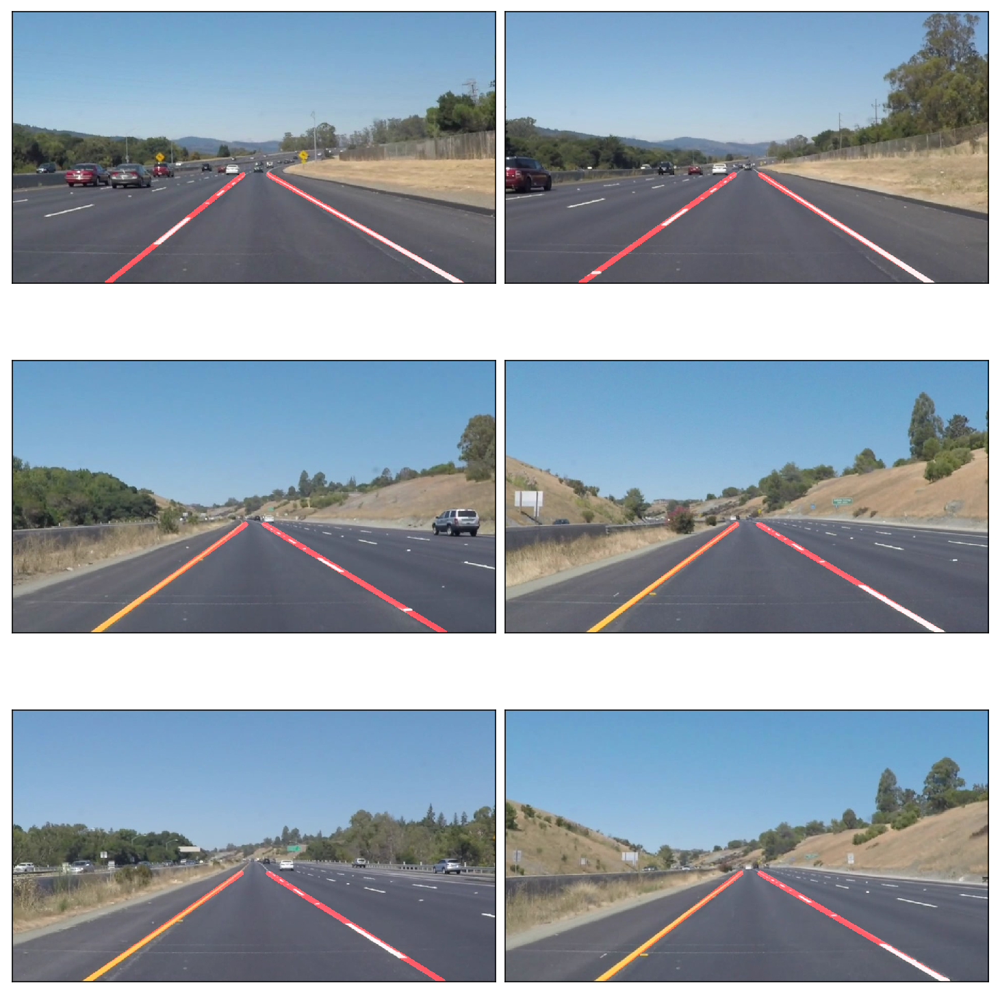

In [13]:
lane_images = []
for image, lines in zip(test_images, list_of_lines):
    lane_images.append(draw_lane_lines(image, lane_lines(image, lines)))   
display_images(lane_images)

## Class construction for Lane Overlay

In [14]:
from collections import deque

#Estimate the queue length
MAX_QUEUE_LENGTH=50

class LaneOverlay:
    #define constructor
    def __init__(self):
        #left and right lines to be freed
        self.left_lines  = deque(maxlen=MAX_QUEUE_LENGTH)
        self.right_lines = deque(maxlen=MAX_QUEUE_LENGTH)

    def detect(self, image):
        #Apply the Yellow and White mask to correctly identify the lane marks
        white_yellow = Apply_YW_mask(image)
        # Apply gray scale in the image
        gray         = gray_scale(white_yellow)
        # Smooth the image using gaussian blur
        image_smoothened  = apply_smoothing(gray)
        # Canny the image to get the edges
        edges        = canny_edges(image_smoothened)
        # identify the regions of interest
        regions      = select_region(edges)
        # identify the hough lines
        lines        = hough_lines(regions)
        # identify the left and right line
        left_line, right_line = lane_lines(image, lines)

        def draw_avg_line(line, lines):
            if line is not None:
                lines.append(line)

            if len(lines)>0:
                line = np.mean(lines, axis=0, dtype=np.int32)
                line = tuple(map(tuple, line)) # make sure it's tuples not numpy array for cv2.line to work
            return line
        # Compute the average interpolated line 
        left_line  = draw_avg_line(left_line,  self.left_lines)
        right_line = draw_avg_line(right_line, self.right_lines)

        return draw_lane_lines(image, (left_line, right_line))

## Main Loop to call the class

In [15]:
folder = "test_images/"
Output = "test_images_output/"

for filename in os.listdir(folder):  
    image = mpimg.imread(folder + filename)
    compute = LaneOverlay()
    outimage = compute.detect(image)
    mpimg.imsave(Output + filename, outimage)   

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [16]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [17]:
def process_video(video_input, video_output):
    detector = LaneOverlay()

    clip = VideoFileClip(os.path.join('test_videos', video_input))
    detection = clip.fl_image(detector.detect)
    detection.write_videofile(os.path.join('test_videos_output', video_output), audio=False)

Let's try the one with the solid white lane on the right first ...

In [18]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
#%time white_clip.write_videofile(white_output, audio=False)
%time process_video('solidWhiteRight.mp4', 'solidWhiteRight.mp4')

Moviepy - Building video test_videos_output\solidWhiteRight.mp4.
Moviepy - Writing video test_videos_output\solidWhiteRight.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output\solidWhiteRight.mp4
Wall time: 7.89 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [20]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
#clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
#yellow_clip = clip2.fl_image(process_image)
#%time yellow_clip.write_videofile(yellow_output, audio=False)
%time process_video('solidYellowLeft.mp4', 'solidYellowLeft.mp4')

Moviepy - Building video test_videos_output\solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output\solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output\solidYellowLeft.mp4
Wall time: 18.1 s


In [21]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [22]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
%time process_video('challenge.mp4', 'challenge.mp4')

Moviepy - Building video test_videos_output\challenge.mp4.
Moviepy - Writing video test_videos_output\challenge.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output\challenge.mp4
Wall time: 15.9 s


In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))